In [1]:
import commot as ct
import scanpy as sc
import pandas as pd
import numpy as np
import squidpy as sq

import matplotlib.pyplot as plt

import os
os.environ['R_HOME'] = '/home/tbou/miniconda3/envs/COMMOT/lib/R'
os.environ['R_USER'] = '/home/tbou/miniconda3/envs/COMMOT/lib/python3.7/site-packages/rpy2'

plt.rcParams["svg.fonttype"] = "none"
plt.rcParams["font.family"] = ["sans-serif"]
plt.rcParams["font.sans-serif"] = ["Arial"]
plt.rcParams["pdf.fonttype"] = 42
plt.rcParams["savefig.bbox"]="tight"
plt.rcParams["savefig.format"]='svg'




sc.set_figure_params(color_map = 'bwr',vector_friendly=True, format='svg')

save_path ='/home/tbou/data/human_dev_face/exports/'
face='Sag-Mandible-tongue'
library_id='V12U07-297_B1_alltissue'

In [2]:
adata = sc.read_h5ad('/home/tbou/data/human_dev_face/h5ad/070623_B1_sagital-mandible.h5ad')
adata.var_names_make_unique()


In [3]:
adata=adata.raw.to_adata()
adata.raw=adata
adata_dis500=adata.copy()

In [4]:
scale = adata_dis500.uns['spatial'][library_id]['scalefactors']['tissue_hires_scalef']
im = sq.im.ImageContainer(adata_dis500.uns['spatial'][library_id]['images']['hires'],
                           scale=scale, library_id=library_id)

[<AxesSubplot:title={'center':'cluster_denoised'}, xlabel='spatial1', ylabel='spatial2'>]

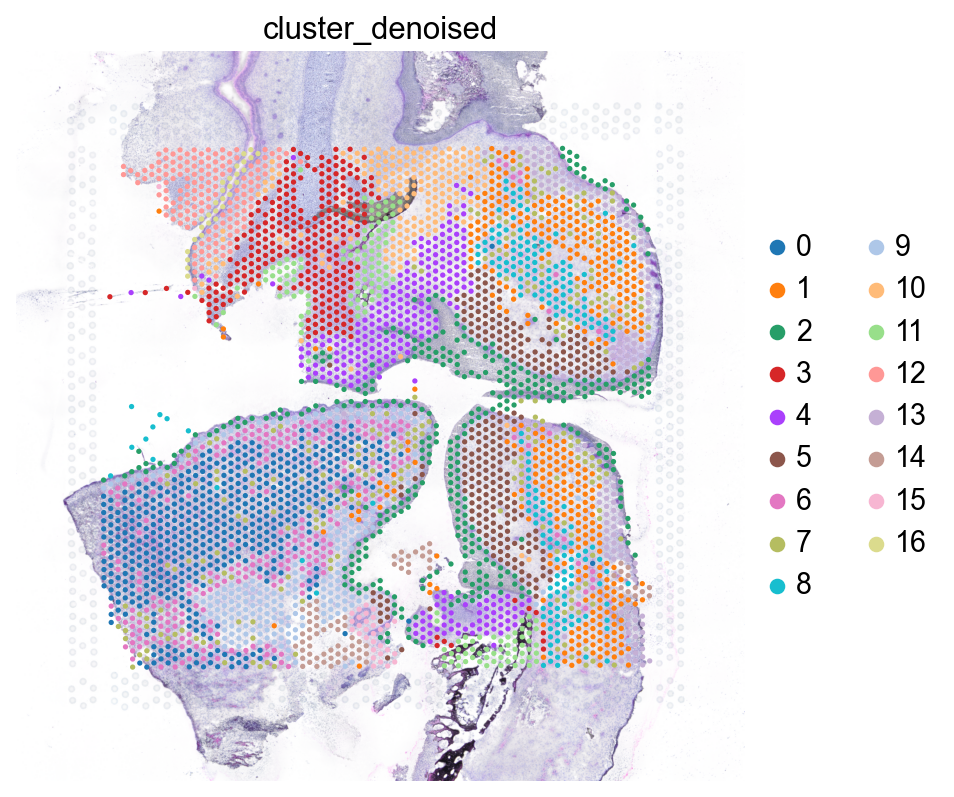

In [7]:
fig, ax = plt.subplots(1, 1, figsize=(6, 6))
im.show(ax=ax)
sc.pl.spatial(adata_dis500, img_key='hires',color='cluster_denoised',ax=ax,scale_factor=scale, show=False)


In [8]:
df_cellchat =ct.pp.ligand_receptor_database(database='CellChat', species='human')
df_cellchat_filtered = ct.pp.filter_lr_database(df_cellchat, adata_dis500, min_cell_pct=0.05)
ct.tl.spatial_communication(adata_dis500,
    database_name='cellchat', df_ligrec=df_cellchat_filtered,
                            dis_thr=500, heteromeric=True, pathway_sum=True)


# Plot sum of scores for communication

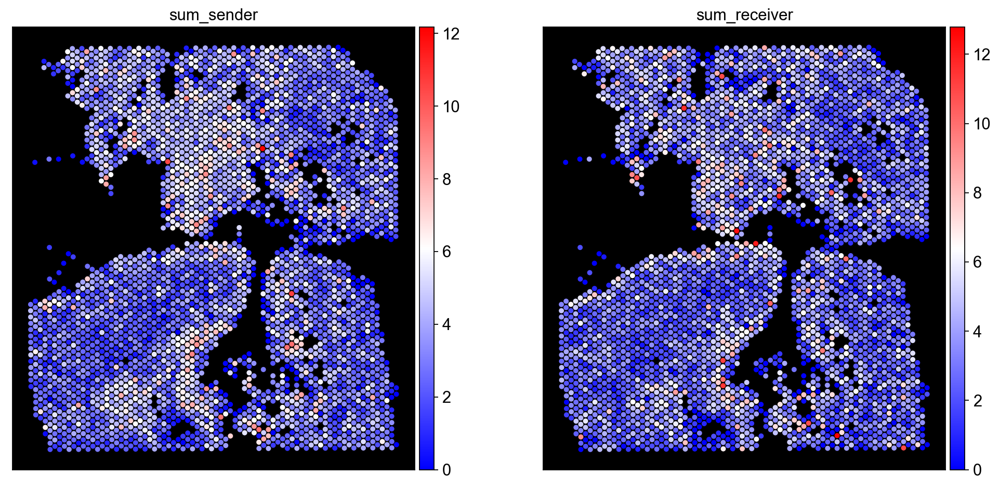

In [10]:
import anndata as ad

ad_sender=ad.AnnData(adata_dis500.obsm['commot-cellchat-sum-sender'].loc[:,[i for i in adata_dis500.obsm['commot-cellchat-sum-sender'].columns if i.count('-')==1]], 
           obsm=adata_dis500.obsm)
ad_sender.obs['sum_sender']=pd.DataFrame(ad_sender.X,columns=ad_sender.var_names, index=ad_sender.obs_names).sum(axis=1).to_list()

ad_receiver=ad.AnnData(adata_dis500.obsm['commot-cellchat-sum-receiver'].loc[:,[i for i in adata_dis500.obsm['commot-cellchat-sum-receiver'].columns if i.count('-')==1]], 
           obsm=adata_dis500.obsm)
ad_receiver.obs['sum_receiver']=pd.DataFrame(ad_receiver.X,columns=ad_receiver.var_names, index=ad_receiver.obs_names).sum(axis=1).to_list()


fig, ax = plt.subplots(1,2,figsize=(15, 7))

plt.rcParams["scatter.marker"]='H'

sc.pl.embedding(ad_sender,#frameon=False,
                  color='sum_sender', 
                  show=False,
                  ax=ax[0],  
                  legend_fontoutline=3,
                  basis='spatial',
                  size=80,#marker='H'
               )

sc.pl.embedding(ad_receiver,#frameon=False,
                  color='sum_receiver', 
                  show=False,
                  ax=ax[1],  
                  legend_fontoutline=3,
                  basis='spatial',
                  size=80,#marker='H'
               )

_=ax[0].set_facecolor('black')
_=ax[1].set_facecolor('black')
_=ax[0].set(xlabel=None, ylabel=None)
_=ax[1].set(xlabel=None, ylabel=None)

#plt.axis('off')

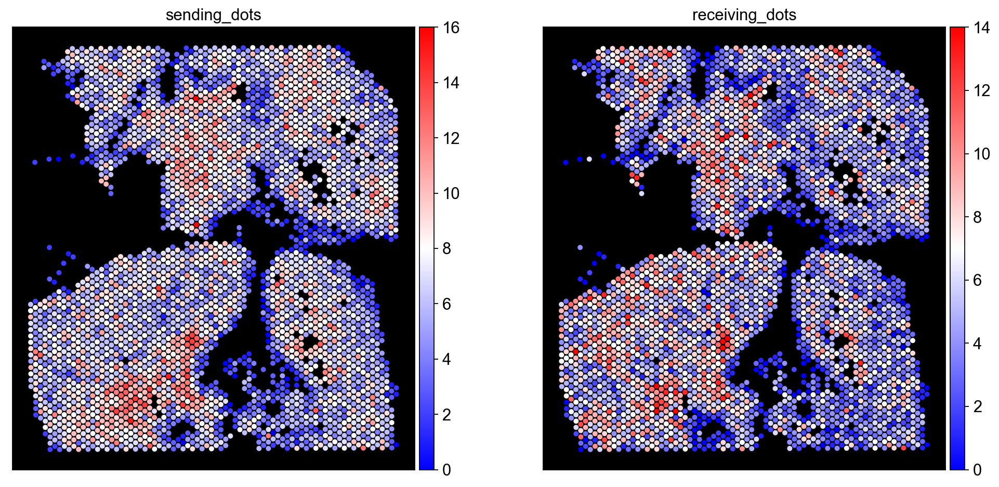

In [12]:
sending=[]
for i in pd.DataFrame(ad_sender.X,columns=ad_sender.var_names, index=ad_sender.obs_names).index:    
    paths=[p for p in pd.DataFrame(ad_sender.X,columns=ad_sender.var_names, index=ad_sender.obs_names).loc[i,:] if p>0 ]
    sending.append(len(paths))
ad_sender.obs['sending_dots']=sending

receiving=[]
for i in pd.DataFrame(ad_receiver.X,columns=ad_receiver.var_names, index=ad_receiver.obs_names).index:    
    paths=[p for p in pd.DataFrame(ad_receiver.X,columns=ad_receiver.var_names, index=ad_receiver.obs_names).loc[i,:] if p>0 ]
    receiving.append(len(paths))
ad_receiver.obs['receiving_dots']=receiving


fig, ax = plt.subplots(1,2,figsize=(15, 7))

plt.rcParams["scatter.marker"]='H'

sc.pl.embedding(ad_sender,#frameon=False,
                  color='sending_dots', 
                  show=False,
                  ax=ax[0],  
                  legend_fontoutline=3,
                  basis='spatial',
                  size=80,#marker='H'
               )

sc.pl.embedding(ad_receiver,#frameon=False,
                  color='receiving_dots', 
                  show=False,
                  ax=ax[1],  
                  legend_fontoutline=3,
                  basis='spatial',
                  size=80,#marker='H'
               )

_=ax[0].set_facecolor('black')
_=ax[1].set_facecolor('black')
_=ax[0].set(xlabel=None, ylabel=None)
_=ax[1].set(xlabel=None, ylabel=None)
plt.savefig(save_path+'embeddings/'+face+'_COMMOT_spatial_sender-receiver_SUM.svg',dpi=150)

# Plot all cell communication together

Text(0.5, 0.98, 'Cell communication SENDER plots for the   Sag-Mandible-tongue')

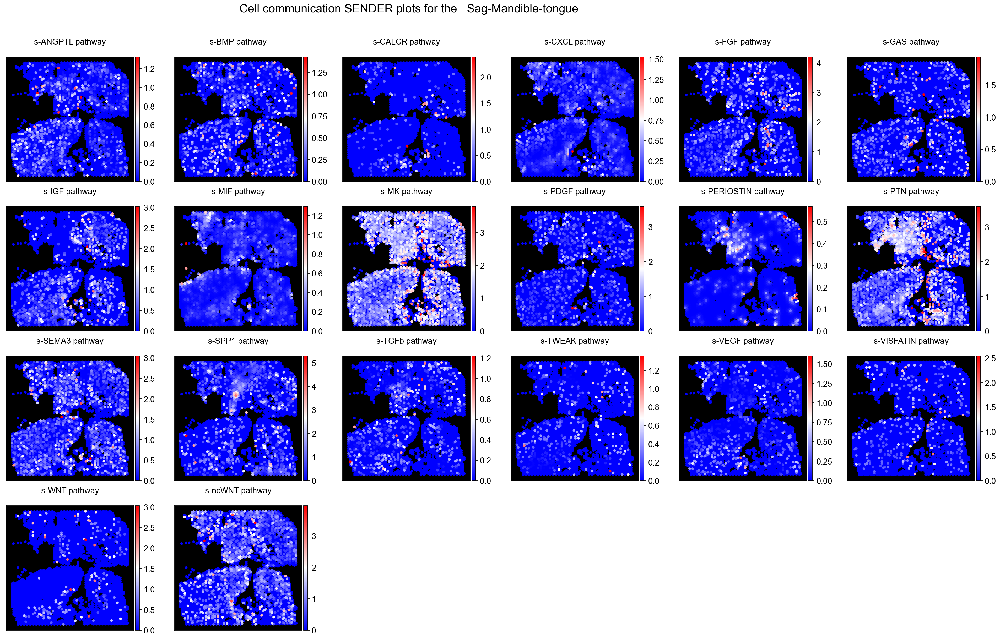

In [14]:
# Print plots all sender together
import math
ncol=6
paths=sorted(list(set(ad_sender.var_names)))
nrows=math.ceil(len(paths)/5)
#fig, ax = plt.subplots(figsize=(ncol*5, nrows*5))
plt.figure(figsize=(30, nrows*4.5))
plt.subplots_adjust(hspace=0.2, wspace=.2)



  

for n, p in enumerate(paths):
    
    ax = plt.subplot(nrows, ncol, n + 1)
    
    sc.pl.embedding(ad_sender,#frameon=False,
                  color=p, 
                  show=False,
                  ax=ax,  
                  legend_fontoutline=3,
                  basis='spatial',
                  size=80,#marker='H'
               )
    _=ax.set_facecolor('black')
    ax.set_title(p +' pathway',y=1.1, pad=0)   
    ax.set(xlabel=None, ylabel=None)
    
    
    ax.legend_ = None
    
plt.suptitle(fontsize=20, t='Cell communication SENDER plots for the   ' + face, y=.98)    
plt.savefig(save_path+'embeddings/'+face+'_COMMOT_spatial_sender_INDIVIDUAL.svg',dpi=150)    

Text(0.5, 0.98, 'Cell communication RECEIVER plots for the   Sag-Mandible-tongue')

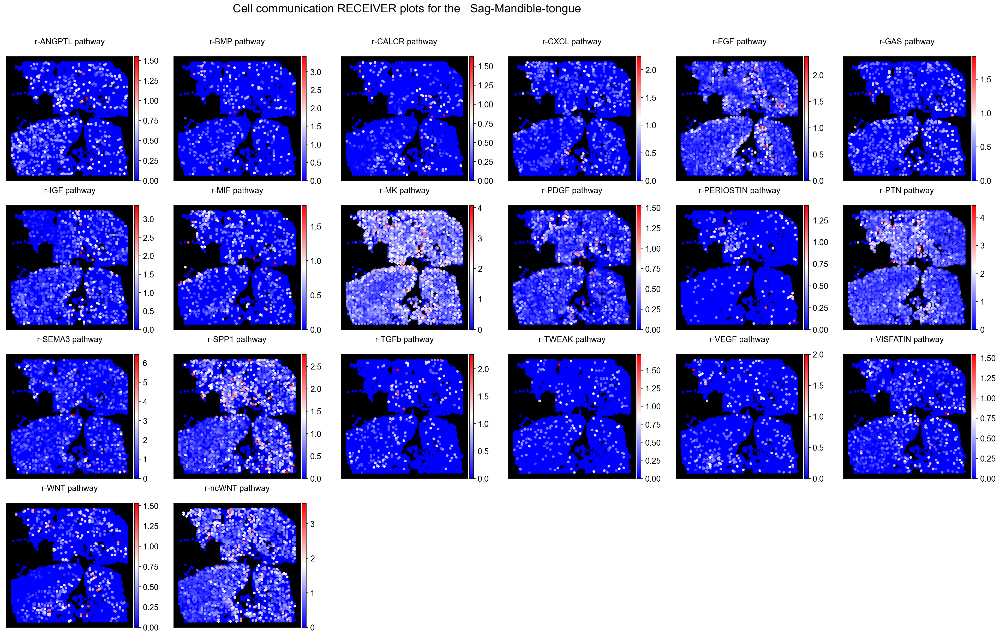

In [15]:
# Print plots all receiver together

import math
ncol=6
paths=sorted(list(set(ad_receiver.var_names)))
nrows=math.ceil(len(paths)/5)
#fig, ax = plt.subplots(figsize=(ncol*5, nrows*5))
plt.figure(figsize=(30, nrows*4.5))
plt.subplots_adjust(hspace=0.2, wspace=.2)



  

for n, p in enumerate(paths):
    
    ax = plt.subplot(nrows, ncol, n + 1)
    
    sc.pl.embedding(ad_receiver,#frameon=False,
                  color=p, 
                  show=False,
                  ax=ax,  
                  legend_fontoutline=3,
                  basis='spatial',
                  size=80,#marker='H'
               )
    _=ax.set_facecolor('black')
    ax.set_title(p +' pathway',y=1.1, pad=0)   
    ax.set(xlabel=None, ylabel=None)
    
    
    ax.legend_ = None

plt.suptitle(fontsize=20, t='Cell communication RECEIVER plots for the   ' + face, y=.98)    
plt.savefig(save_path+'embeddings/'+face+'_COMMOT_spatial_receiver_INDIVIDUAL.svg',dpi=150)     

# Plot all cell communication together

Text(0.5, 0.901, 'Cell communication plots for the   Sag-Mandible-tongue')

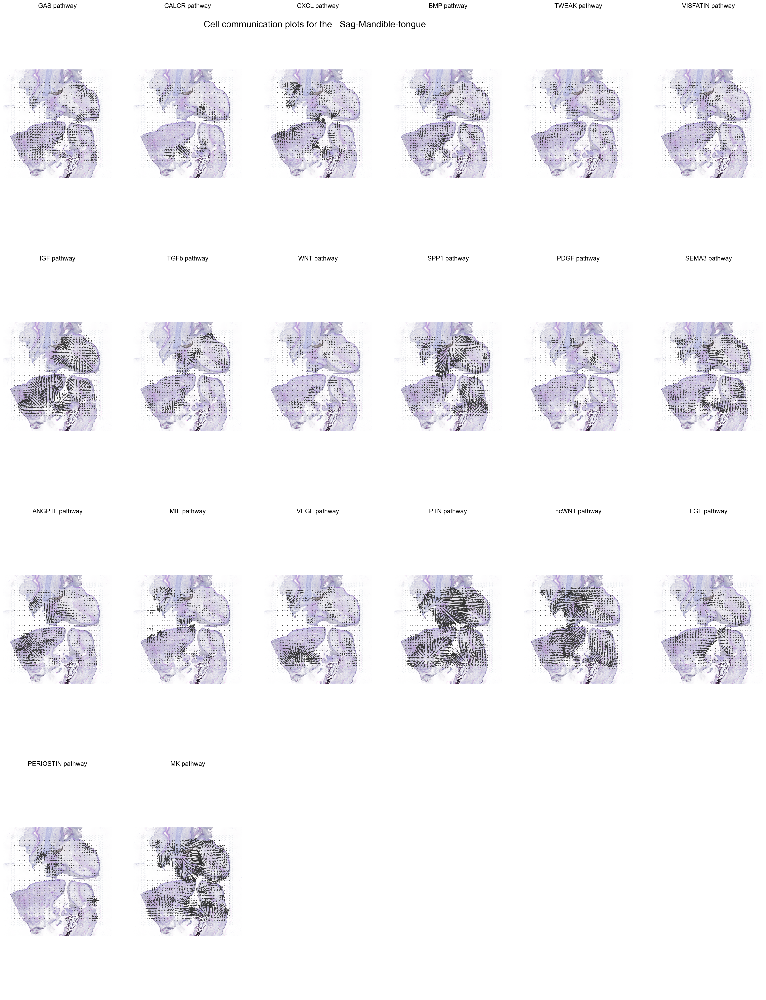

In [17]:
# Print plots all together
import math
ncol=6
nrows=math.ceil(len(list(set(df_cellchat_filtered.loc[:,2])))/5)
#fig, ax = plt.subplots(figsize=(ncol*5, nrows*5))
plt.figure(figsize=(30, 40))
plt.subplots_adjust(hspace=0.1, wspace=.2)


paths=list(set(df_cellchat_filtered.loc[:,2]))
  

for n, p in enumerate(paths):
    
    ax = plt.subplot(nrows, ncol, n + 1)
   
    ct.tl.communication_direction(adata_dis500, database_name='cellchat', pathway_name=p, k=5)
    
    ct.pl.plot_cell_communication(adata_dis500,ax=ax, database_name='cellchat', pathway_name=p, 
                                     plot_method='grid',                                      
                                     background_legend=True,
                                    scale=0.00003, grid_density=.7, summary='sender', 
                                    background='image', 
                                    ndsize=10 ,
                                    #arrow_color = ['red'],
                                    #background='summary' ,
                                   # clustering='cluster_denoised',# cmap='Alphabet',
                                    normalize_v = True, normalize_v_quantile=0.995)
  
    ax.set_title(p +' pathway', pad=-70)       
    
    ax.legend_ = None
    
    
plt.suptitle(fontsize=20, t='Cell communication plots for the   ' + face, y=.901)
plt.savefig(save_path+'embeddings/'+face+'_COMMOT_spatial.svg',dpi=150)